In [1]:
import numpy as np
import cupy as cp
from holotomocupy.holo import G, GT
from holotomocupy.shift import S, ST
from holotomocupy.recon_methods import CTFPurePhase, multiPaganin
from holotomocupy.utils import *
from holotomocupy.proc import remove_outliers
import h5py




astropy module not found
olefile module not found


# Init data sizes and parametes of the PXM of ID16A

In [2]:
n = 2048  # object size in each dimension
pad = n//8
npos= 18*18
pos_step = 1
z1c = -20.1e-3
# thickness of the coded aperture
code_thickness = 1.8e-6 #in m
# feature size
ill_feature_size = 2e-6 #in m

detector_pixelsize = 3.03751e-6
energy = 33.35  # [keV] xray energy
wavelength = 1.2398419840550367e-09/energy  # [m] wave length
focusToDetectorDistance = 1.28  # [m]
sx0 = 3.7e-4
z1 = z1c
z1 = np.tile(z1, [npos])
z2 = focusToDetectorDistance-z1
distances = (z1*z2)/focusToDetectorDistance
magnifications = focusToDetectorDistance/z1
voxelsize = np.abs(detector_pixelsize/magnifications[0]*2048/n)  # object voxel size

# sample size after demagnification
# ne = 6144+2*pad
ne = 3096+256+2*pad
# ne = 3096+256+2*pad
show = True

flg = f'{n}_{z1c}'
path = f'/data2/vnikitin/nfp_codes'
print(voxelsize)

4.769839921875e-08


## Read data

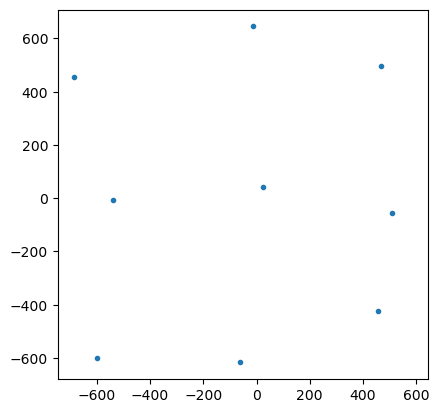

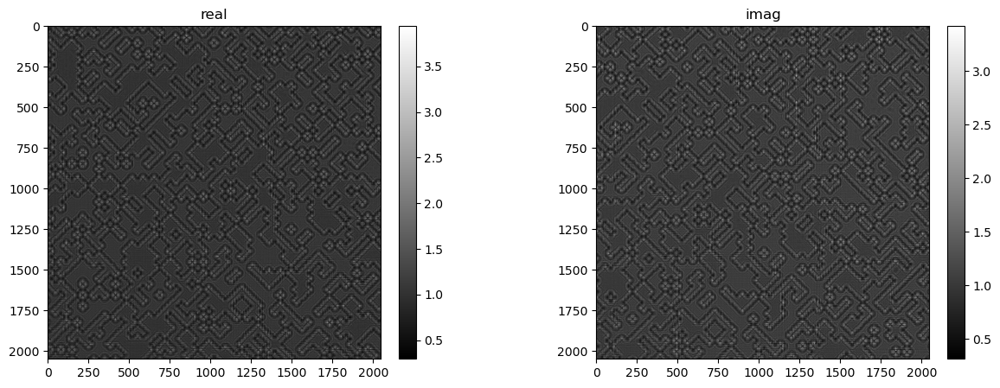

npos=9


In [3]:
with h5py.File('/data/vnikitin/ESRF/ID16A/20240924/SiemensLH/code2um_nfp18x18_01/code2um_nfp18x18_010000.h5') as fid:
    data0 = fid['/entry_0000/measurement/data'][:npos].astype('float32')
    
with h5py.File('/data/vnikitin/ESRF/ID16A/20240924/SiemensLH/code2um_nfp18x18_01/ref_0000.h5') as fid:
    ref0 = fid['/entry_0000/measurement/data'][:].astype('float32')
with h5py.File('/data/vnikitin/ESRF/ID16A/20240924/SiemensLH/code2um_nfp18x18_01/dark_0000.h5') as fid:
    dark0 = fid['/entry_0000/measurement/data'][:].astype('float32')

data0 = data0[np.newaxis]

# shifts_code0 = np.loadtxt(f'/data/vnikitin/ESRF/ID16A/20240924/positions/shifts_code_nfp18x18ordered.txt')[np.newaxis,:,::-1]
# shifts_code0 = shifts_code0/voxelsize*1e-6
# print(shifts_code0[0,:10])

shifts_code0 = np.load(f'shifts_code_new.npy')
shifts_code0 += 150# it appears like that
shifts_code0[:,:,1]*=-1

shifts_code0 = shifts_code0.reshape(1,int(np.sqrt(npos)),int(np.sqrt(npos)),2)
shifts_code0 = shifts_code0[:,::pos_step,::pos_step,:].reshape(1,npos//pos_step**2,2)
data0 = data0.reshape(1,int(np.sqrt(npos)),int(np.sqrt(npos)),n,n)
data0 = data0[:,::pos_step,::pos_step,:].reshape(1,npos//pos_step**2,n,n)

ids = np.where((np.abs(shifts_code0[0,:,0])<ne//2-n//2)*(np.abs(shifts_code0[0,:,1])<ne//2-n//2))[0]#[0:2]
data0 = data0[:,ids]
shifts_code0 = shifts_code0[:,ids]
plt.plot(shifts_code0[0,:,0],shifts_code0[0,:,1],'.')
plt.axis('square')
plt.show()

mshow_complex(data0[0,0]/ref0[0]+1j*data0[0,1]/ref0[0],show)
npos = len(ids)
print(f'{npos=}')

In [4]:
data = data0.copy()
ref = ref0.copy()
dark = dark0.copy()
for k in range(npos):
    radius = 7
    threshold = 20000
    data[:,k] = remove_outliers(data[:,k], radius, threshold)
ref[:] = remove_outliers(ref[:], radius, threshold)     
dark[:] = remove_outliers(dark[:], radius, threshold)     

# data[data<=0] = 0
# ref[ref<=0] = 0

data/=np.mean(ref)
dark/=np.mean(ref)
ref/=np.mean(ref)

rdata0 = (data-np.mean(dark,axis=0))/(np.mean(ref,axis=0)-np.mean(dark,axis=0))


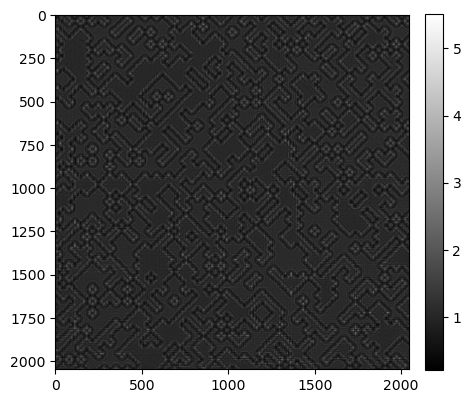

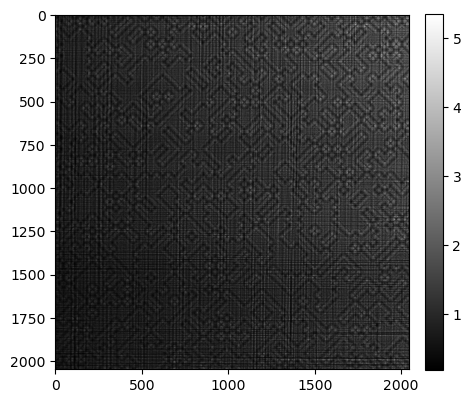

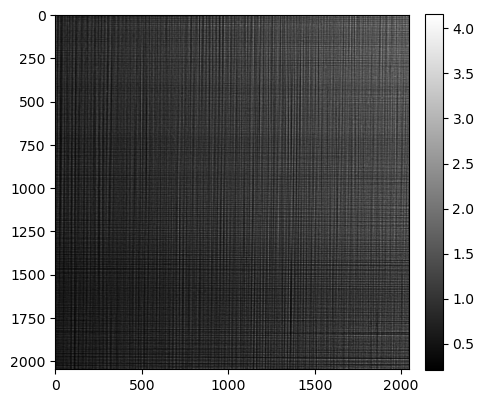

In [5]:
mshow(rdata0[0,0],show)
mshow(data[0,0],show)
mshow(ref[0],show)

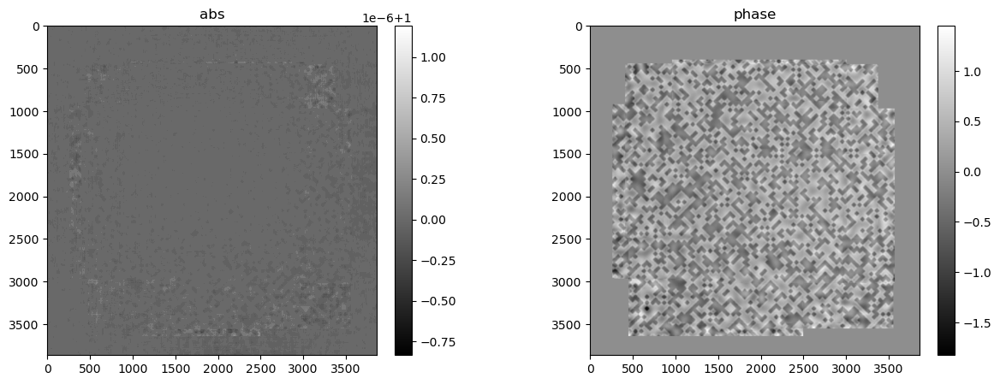

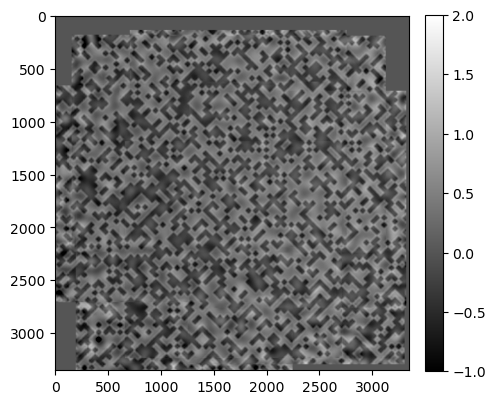

In [6]:
rdata=cp.array(rdata0)
shifts_code = cp.array(shifts_code0)
recMultiPaganin = np.zeros([1,npos,ne,ne],dtype='complex64')
recMultiPaganinr = np.zeros([1,npos,ne,ne],dtype='complex64')# to compensate for overlap
for j in range(0,npos):
    r = multiPaganin(cp.array(rdata[:,j:j+1]),
                       distances[j:j+1], wavelength, voxelsize,  24.05, 5e-2)    
    rr = r*0+1 # to compensate for overlap
    r = cp.pad(r,((0,0), (ne//2-n//2,ne//2-n//2), (ne//2-n//2,ne//2-n//2)),'constant')   
    rr = cp.pad(rr,((0,0), (ne//2-n//2,ne//2-n//2), (ne//2-n//2,ne//2-n//2)),'constant')   
    recMultiPaganin[:,j] = ST(r,shifts_code[:,j]).get()
    recMultiPaganinr[:,j] = ST(rr,shifts_code[:,j]).get()
    
recMultiPaganin = np.sum(recMultiPaganin,axis=1)
recMultiPaganinr = np.sum(recMultiPaganinr,axis=1)

# avoid division by 0
recMultiPaganinr[np.abs(recMultiPaganinr)<5e-2] = 1

# compensate for overlap
recMultiPaganin /= recMultiPaganinr
recMultiPaganin = np.exp(1j*recMultiPaganin)

# pad = 1024*3
mshow_polar(recMultiPaganin[0],show)
mshow(np.angle(recMultiPaganin[0,pad:-pad,pad:-pad]),show,vmax=2,vmin=-1)


# Construct operators


In [7]:
def Lop(psi):
    psi = cp.array(psi)

    data = cp.zeros([psi.shape[0], npos, n, n], dtype='complex64')
    for i in range(npos):
        psir = psi[:,i].copy()       
        psir = G(psir, wavelength, voxelsize, distances[i])
        data[:, i] = psir[:, pad:n+pad, pad:n+pad]
    return data

def LTop(data):
    psi = cp.zeros([data.shape[0],npos, n+2*pad, n+2*pad], dtype='complex64')

    for j in range(npos):
        psir = cp.pad(data[:, j], ((0, 0), (pad, pad), (pad, pad))).astype('complex64')
        psir = GT(psir, wavelength, voxelsize, distances[j])        
        psi[:,j] = psir
    return psi

def Sop(psi):
    psi = cp.array(psi)

    data = cp.zeros([psi.shape[0], npos, n+2*pad, n+2*pad], dtype='complex64')
    for i in range(npos):
        psir = psi.copy()
    
        # shift and crop the code 
        psir = S(psir, shifts_code[:, i])
        nee = psir.shape[1]        
        data[:,i] = psir[:, nee//2-n//2-pad:nee//2+n//2+pad, nee//2-n//2-pad:nee//2+n//2+pad]
    return data

def STop(data):
    psi = cp.zeros([data.shape[0], ne, ne], dtype='complex64')

    for j in range(npos):
        psir = cp.pad(data[:,j],((0,0),(ne//2-n//2-pad,ne//2-n//2-pad),(ne//2-n//2-pad,ne//2-n//2-pad)))        
        psi += ST(psir,shifts_code[:,j])
    return psi


tmp = cp.array(data)
arr1 = cp.pad(tmp[:,0],((0,0),(ne//2-n//2,ne//2-n//2),(ne//2-n//2,ne//2-n//2)),'symmetric')     
prb1 = cp.ones([1,n+2*pad,n+2*pad],dtype='complex64')
shifts_code = cp.array(shifts_code0)
arr2 = Sop(arr1)
arr3 = STop(arr2)

arr4 = Lop(arr2)
arr5 = LTop(arr4)


print(f'{cp.sum(arr1*cp.conj(arr3))}==\n{cp.sum(arr2*cp.conj(arr2))}')
print(f'{cp.sum(arr2*cp.conj(arr5))}==\n{cp.sum(arr4*cp.conj(arr4))}')

(75392088+9.646869659423828j)==
(75392096-5.5760701611617947e-11j)
(48034152-1.6126708984375j)==
(48034152+2.3600196072948165e-05j)


#### Reconstruction with the CG (Carlsson) with Hessians

(1, 9, 2048, 2048) (1, 3864, 3864) (1, 2560, 2560)
0) alpha=0.04774, err=2.28631e+05


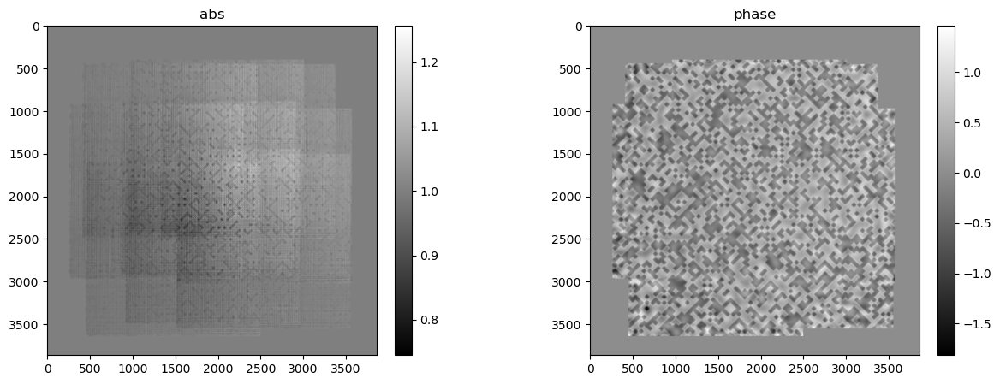

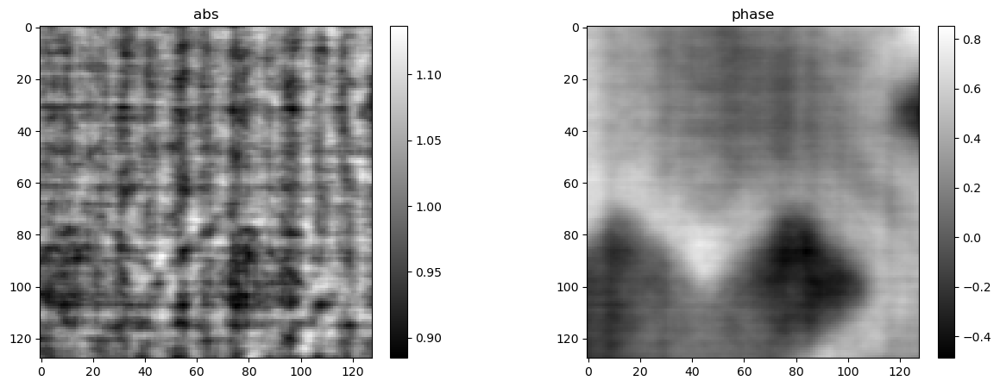

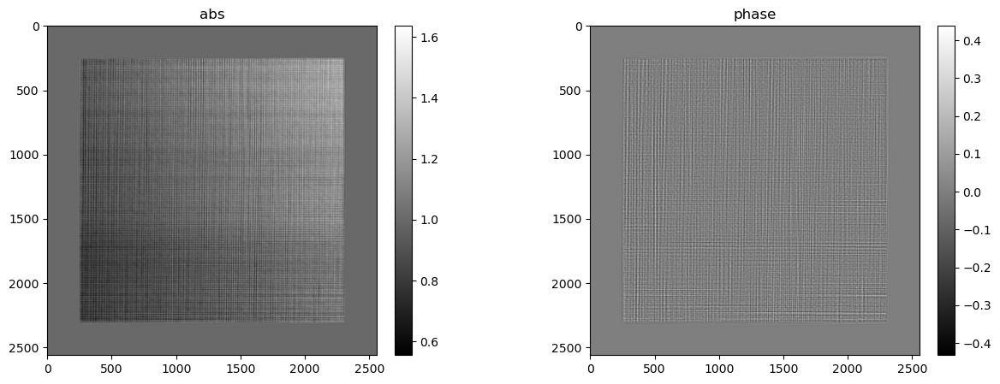

1) alpha=0.06743, err=1.37536e+05
2) alpha=0.09558, err=1.02191e+05
3) alpha=0.08809, err=8.57104e+04
4) alpha=0.10326, err=7.45702e+04
5) alpha=0.11071, err=6.68112e+04
6) alpha=0.10754, err=6.12263e+04
7) alpha=0.11637, err=5.64321e+04
8) alpha=0.11859, err=5.23665e+04
9) alpha=0.11477, err=4.87299e+04
10) alpha=0.12009, err=4.56095e+04
11) alpha=0.11824, err=4.26962e+04
12) alpha=0.11788, err=4.04267e+04
13) alpha=0.11117, err=3.83596e+04
14) alpha=0.11382, err=3.66973e+04
15) alpha=0.11726, err=3.51228e+04
16) alpha=0.11953, err=3.38122e+04


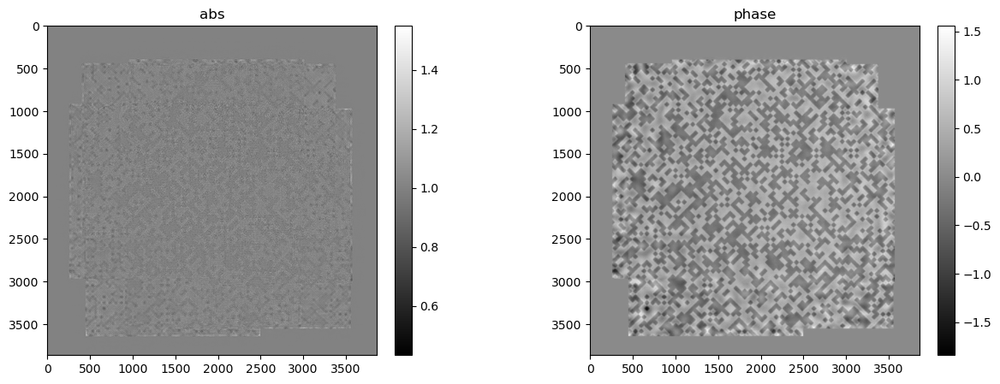

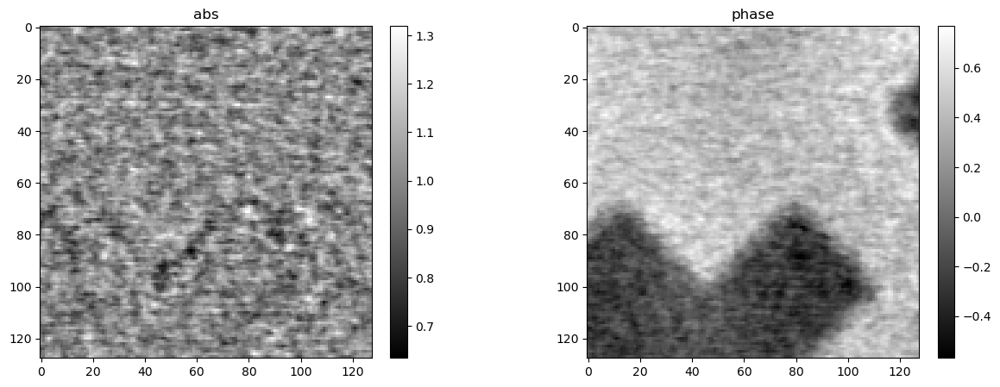

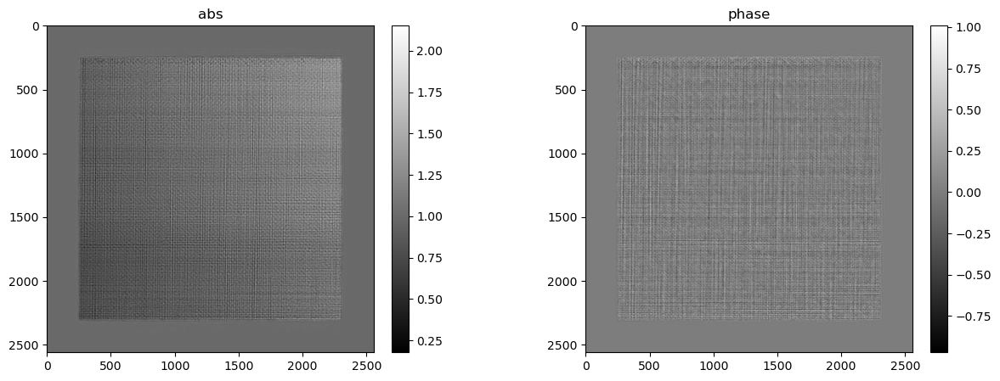

17) alpha=0.12093, err=3.25722e+04
18) alpha=0.11809, err=3.15693e+04
19) alpha=0.11709, err=3.06309e+04
20) alpha=0.11679, err=2.98319e+04
21) alpha=0.12001, err=2.90540e+04
22) alpha=0.11890, err=2.83893e+04
23) alpha=0.12129, err=2.77434e+04
24) alpha=0.11914, err=2.71878e+04
25) alpha=0.12190, err=2.66478e+04
26) alpha=0.11838, err=2.61771e+04
27) alpha=0.12232, err=2.57159e+04
28) alpha=0.11878, err=2.53083e+04
29) alpha=0.12116, err=2.49119e+04
30) alpha=0.11991, err=2.45509e+04
31) alpha=0.12392, err=2.41987e+04
32) alpha=0.12087, err=2.38791e+04


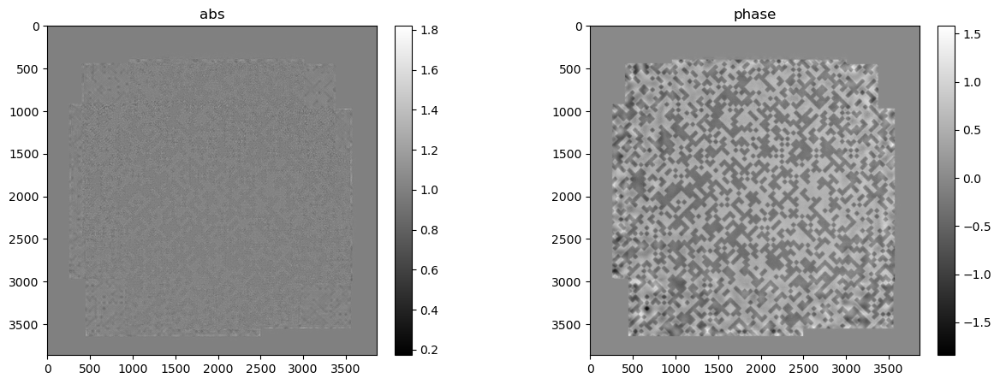

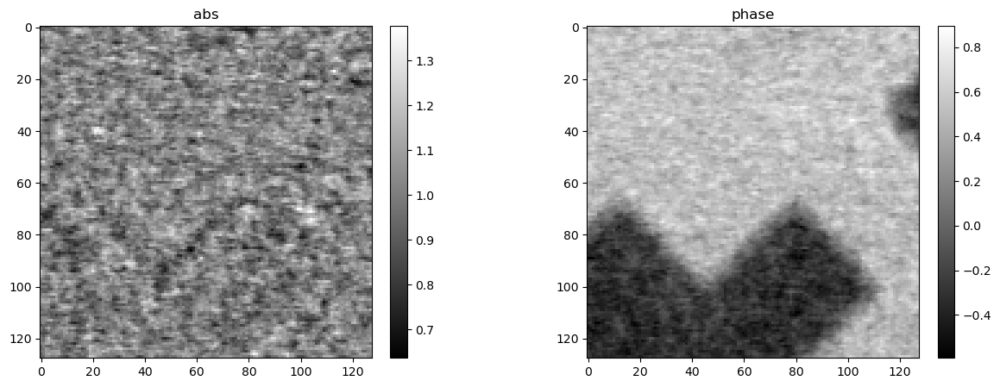

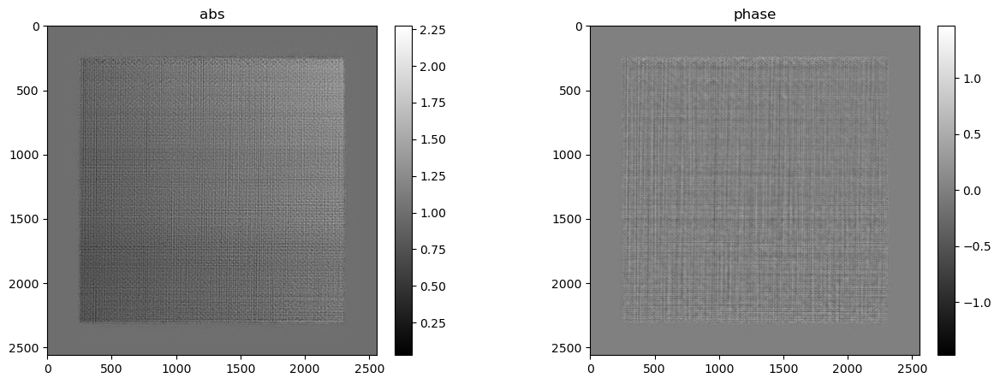

33) alpha=0.12239, err=2.35691e+04
34) alpha=0.12025, err=2.32838e+04
35) alpha=0.12166, err=2.30054e+04
36) alpha=0.12120, err=2.27461e+04
37) alpha=0.12268, err=2.24922e+04
38) alpha=0.12231, err=2.22549e+04
39) alpha=0.12323, err=2.20235e+04
40) alpha=0.12198, err=2.18063e+04
41) alpha=0.12182, err=2.15948e+04
42) alpha=0.12181, err=2.13943e+04
43) alpha=0.12174, err=2.11985e+04
44) alpha=0.12322, err=2.10114e+04
45) alpha=0.12292, err=2.08285e+04
46) alpha=0.12361, err=2.06544e+04
47) alpha=0.12191, err=2.04845e+04
48) alpha=0.12224, err=2.03226e+04


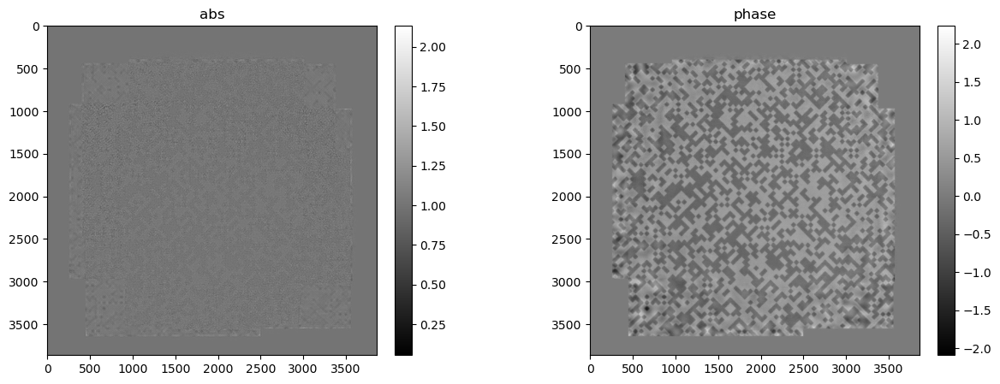

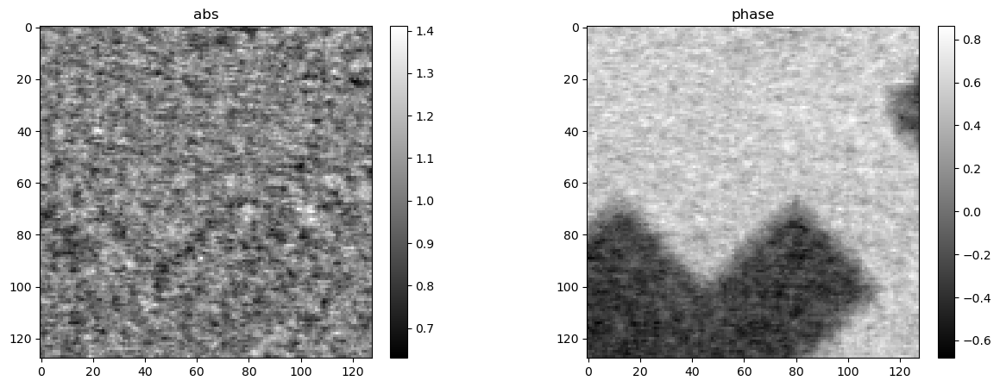

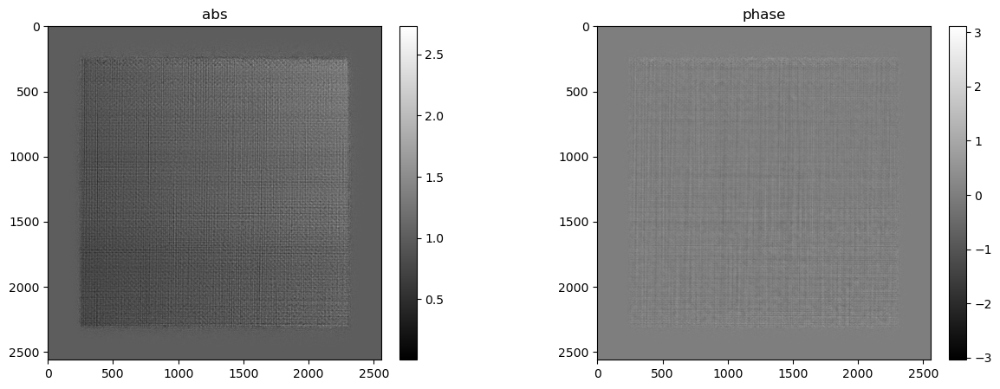

49) alpha=0.12153, err=2.01634e+04
50) alpha=0.12335, err=2.00104e+04
51) alpha=0.12271, err=1.98601e+04
52) alpha=0.12384, err=1.97160e+04
53) alpha=0.12220, err=1.95747e+04
54) alpha=0.12318, err=1.94390e+04
55) alpha=0.12143, err=1.93059e+04
56) alpha=0.12320, err=1.91774e+04
57) alpha=0.12184, err=1.90512e+04
58) alpha=0.12399, err=1.89291e+04
59) alpha=0.12254, err=1.88091e+04
60) alpha=0.12367, err=1.86934e+04
61) alpha=0.12149, err=1.85798e+04
62) alpha=0.12318, err=1.84699e+04
63) alpha=0.12160, err=1.83616e+04
64) alpha=0.12369, err=1.82568e+04


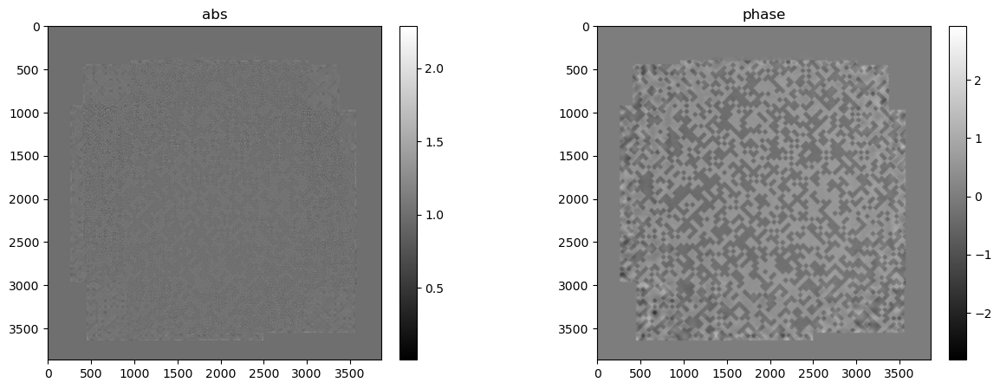

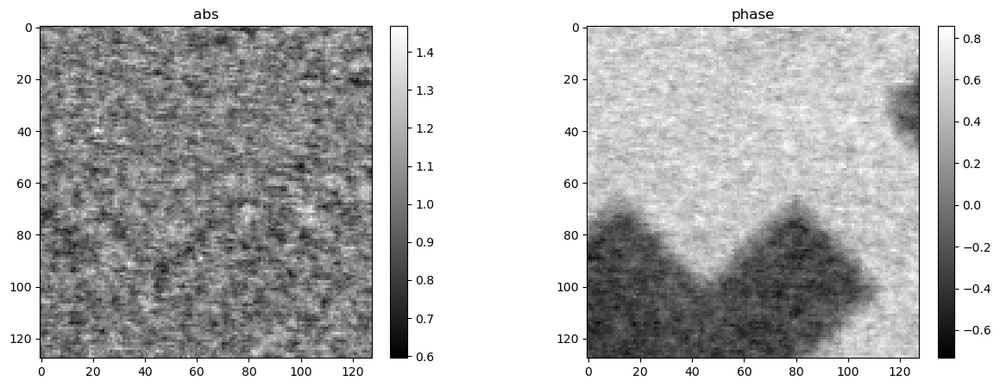

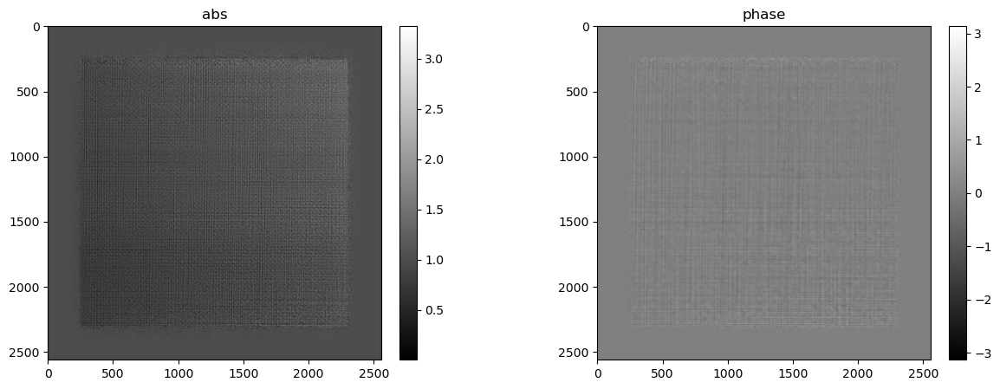

65) alpha=0.12228, err=1.81534e+04
66) alpha=0.12402, err=1.80533e+04
67) alpha=0.12195, err=1.79549e+04
68) alpha=0.12305, err=1.78597e+04
69) alpha=0.12141, err=1.77658e+04
70) alpha=0.12338, err=1.76746e+04
71) alpha=0.12212, err=1.75846e+04
72) alpha=0.12381, err=1.74972e+04
73) alpha=0.12230, err=1.74111e+04
74) alpha=0.12330, err=1.73276e+04
75) alpha=0.12135, err=1.72454e+04
76) alpha=0.12303, err=1.71653e+04
77) alpha=0.12173, err=1.70863e+04
78) alpha=0.12384, err=1.70093e+04
79) alpha=0.12223, err=1.69334e+04
80) alpha=0.12332, err=1.68597e+04


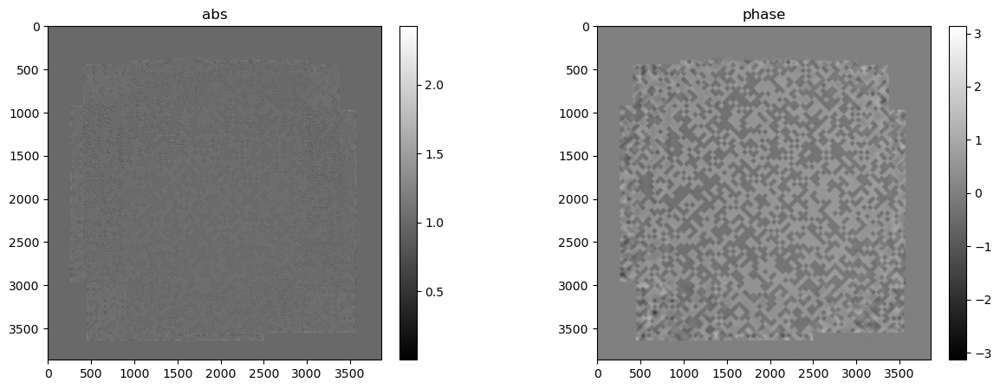

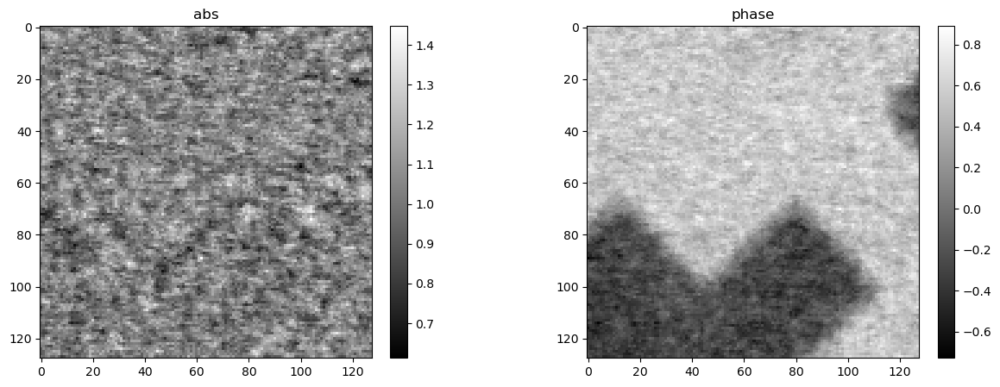

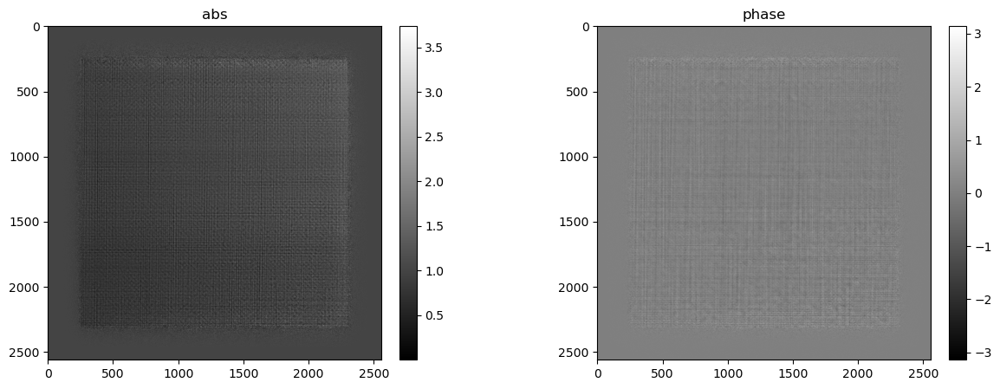

81) alpha=0.12151, err=1.67871e+04
82) alpha=0.12293, err=1.67163e+04
83) alpha=0.12155, err=1.66464e+04
84) alpha=0.12326, err=1.65783e+04
85) alpha=0.12198, err=1.65111e+04
86) alpha=0.12298, err=1.64456e+04
87) alpha=0.12102, err=1.63813e+04
88) alpha=0.12157, err=1.63186e+04
89) alpha=0.11784, err=1.62576e+04
90) alpha=0.11783, err=1.61983e+04
91) alpha=0.10849, err=1.61419e+04
92) alpha=0.11337, err=1.60855e+04
93) alpha=0.10900, err=1.60299e+04
94) alpha=0.11727, err=1.59732e+04
95) alpha=0.12116, err=1.59178e+04
96) alpha=0.11296, err=1.58625e+04


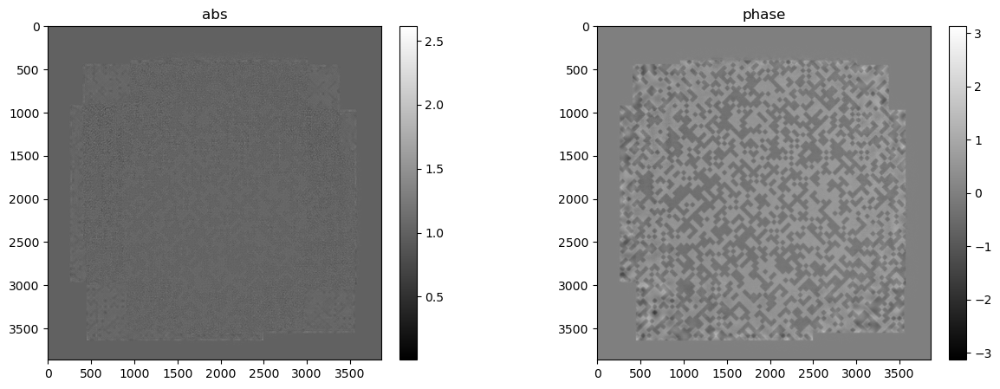

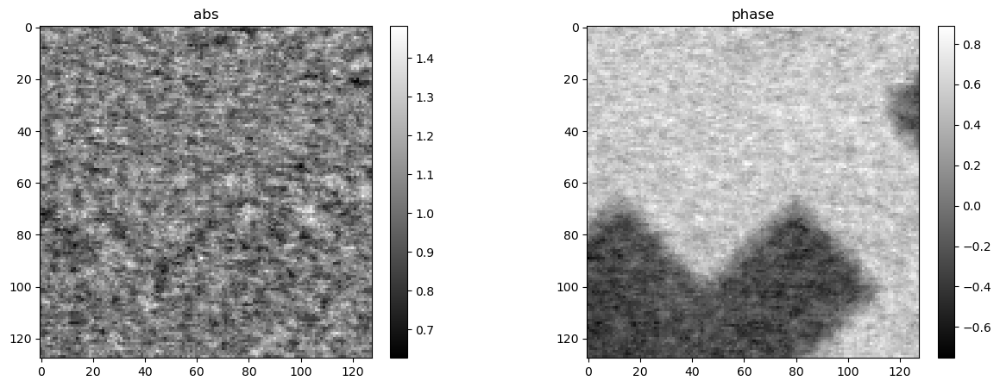

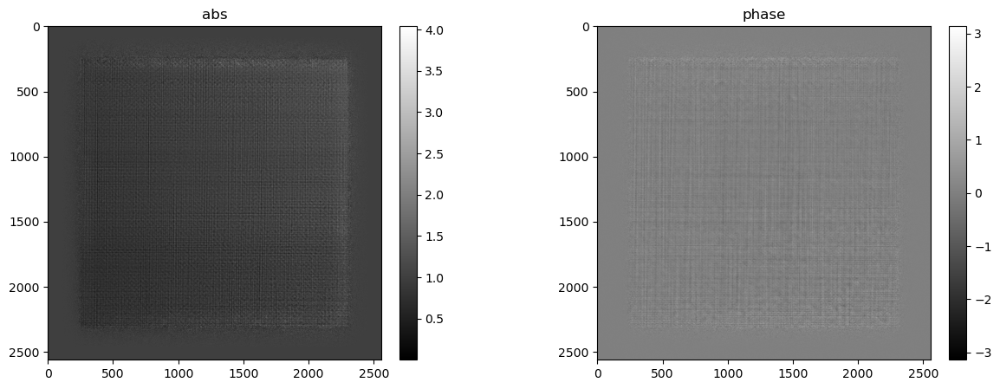

97) alpha=0.12125, err=1.58105e+04
98) alpha=0.11546, err=1.57558e+04
99) alpha=0.11980, err=1.57051e+04
100) alpha=0.12312, err=1.56516e+04
101) alpha=0.11037, err=1.56029e+04
102) alpha=0.11058, err=1.55559e+04
103) alpha=0.11285, err=1.55065e+04
104) alpha=0.12086, err=1.54583e+04
105) alpha=0.12215, err=1.54105e+04
106) alpha=0.10293, err=1.53677e+04
107) alpha=0.11146, err=1.53239e+04
108) alpha=0.11236, err=1.52780e+04
109) alpha=0.12040, err=1.52344e+04
110) alpha=0.11386, err=1.51917e+04
111) alpha=0.10689, err=1.51492e+04
112) alpha=0.11144, err=1.51097e+04


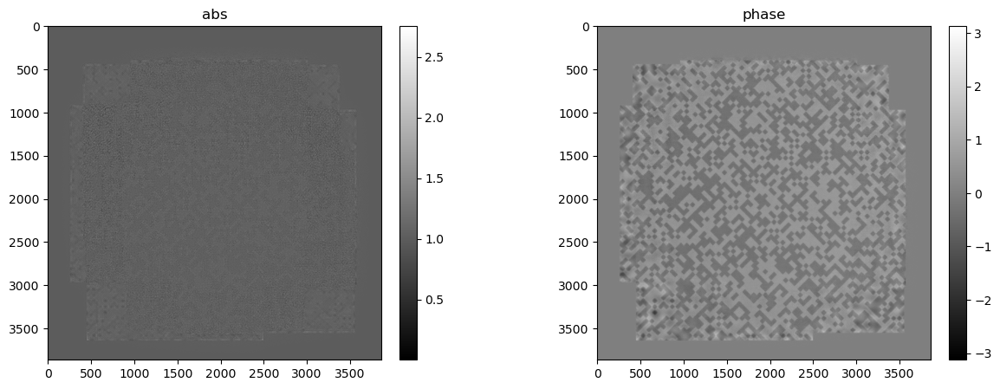

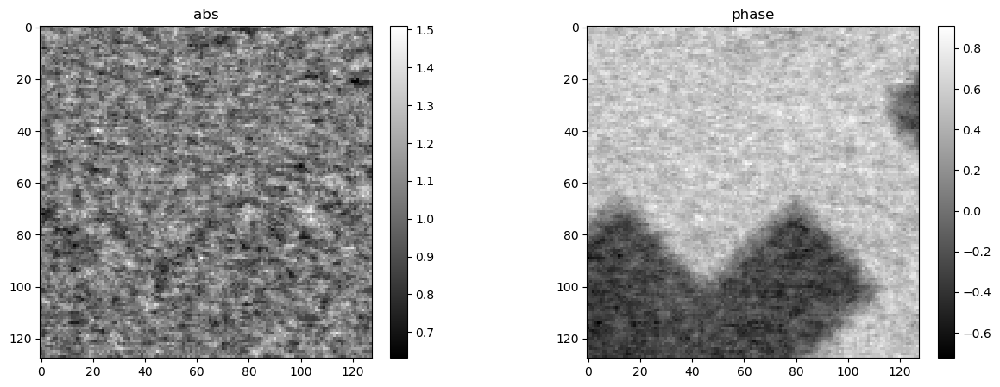

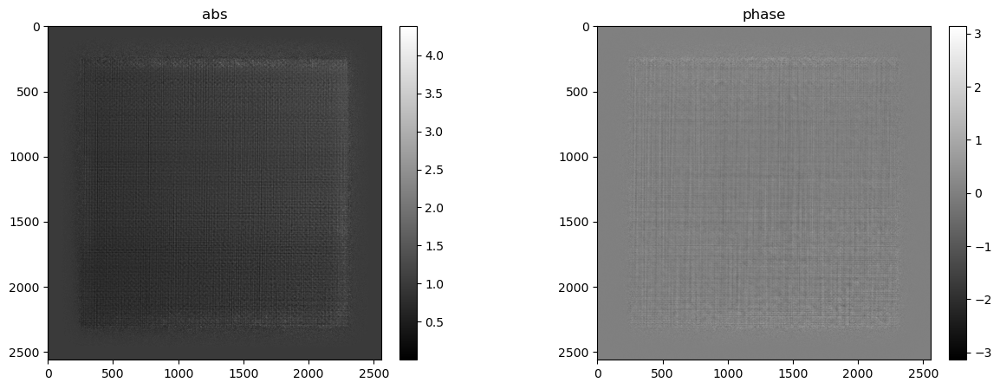

113) alpha=0.10450, err=1.50699e+04
114) alpha=0.09931, err=1.50319e+04
115) alpha=0.11145, err=1.49926e+04
116) alpha=0.11157, err=1.49531e+04
117) alpha=0.11688, err=1.49145e+04
118) alpha=0.11713, err=1.48755e+04
119) alpha=0.11993, err=1.48375e+04
120) alpha=0.11482, err=1.48006e+04
121) alpha=0.10882, err=1.47654e+04
122) alpha=0.11307, err=1.47299e+04
123) alpha=0.11168, err=1.46947e+04
124) alpha=0.11537, err=1.46602e+04
125) alpha=0.11276, err=1.46259e+04
126) alpha=0.11467, err=1.45922e+04
127) alpha=0.11372, err=1.45590e+04
128) alpha=0.10881, err=1.45275e+04


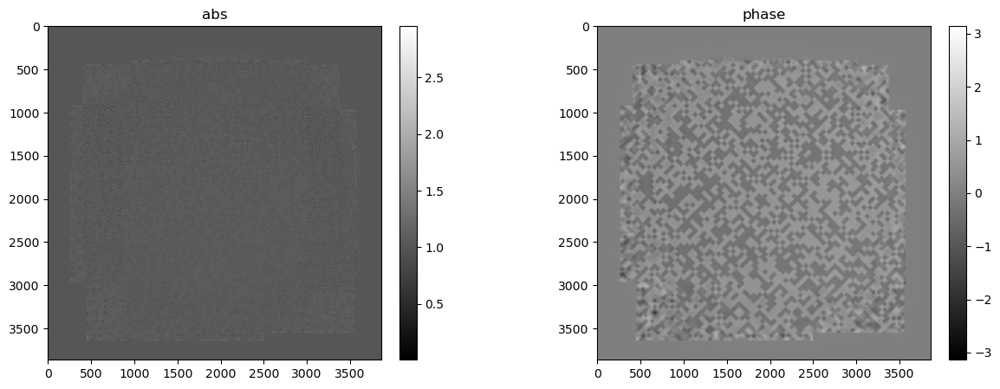

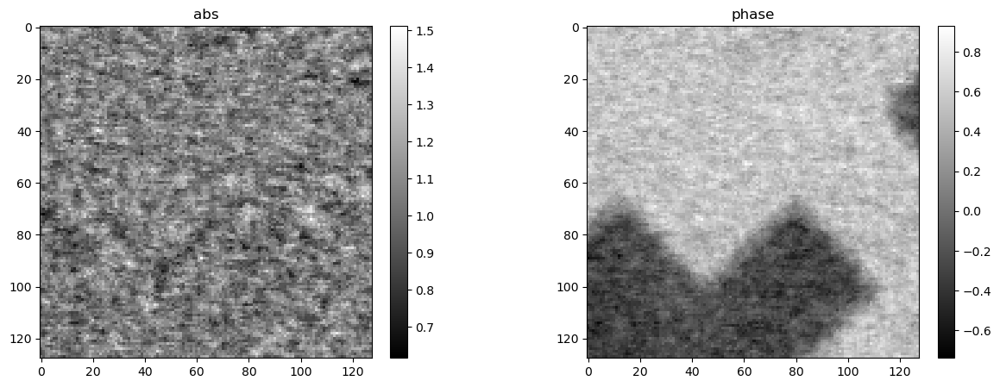

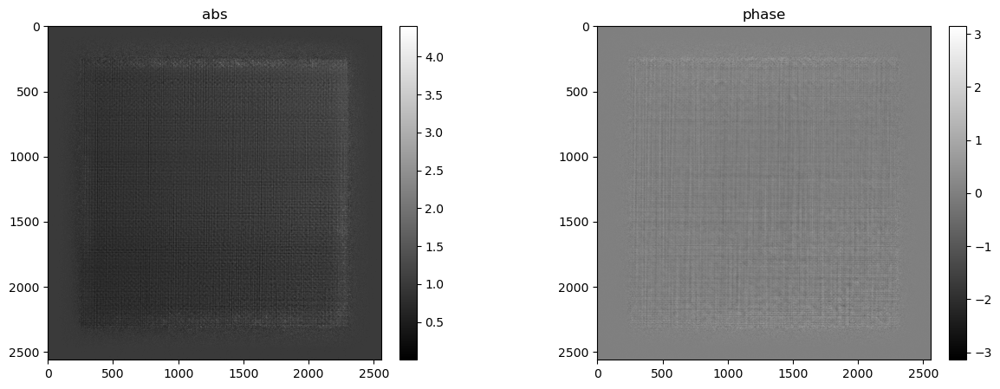

129) alpha=0.10218, err=1.44967e+04
130) alpha=0.10963, err=1.44654e+04
131) alpha=0.11659, err=1.44330e+04
132) alpha=0.11701, err=1.44013e+04
133) alpha=0.11577, err=1.43710e+04
134) alpha=0.11398, err=1.43403e+04
135) alpha=0.11071, err=1.43110e+04
136) alpha=0.11400, err=1.42818e+04
137) alpha=0.11084, err=1.42528e+04
138) alpha=0.11089, err=1.42247e+04
139) alpha=0.10912, err=1.41970e+04
140) alpha=0.10861, err=1.41695e+04
141) alpha=0.11067, err=1.41423e+04
142) alpha=0.11138, err=1.41152e+04
143) alpha=0.11093, err=1.40885e+04
144) alpha=0.11073, err=1.40623e+04


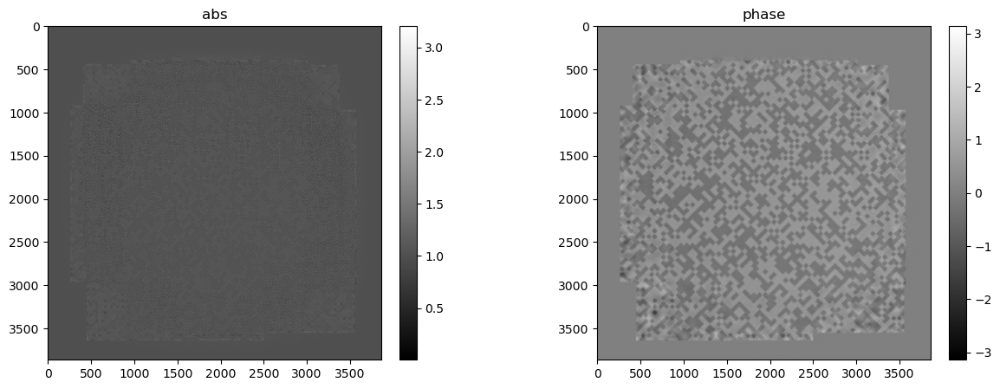

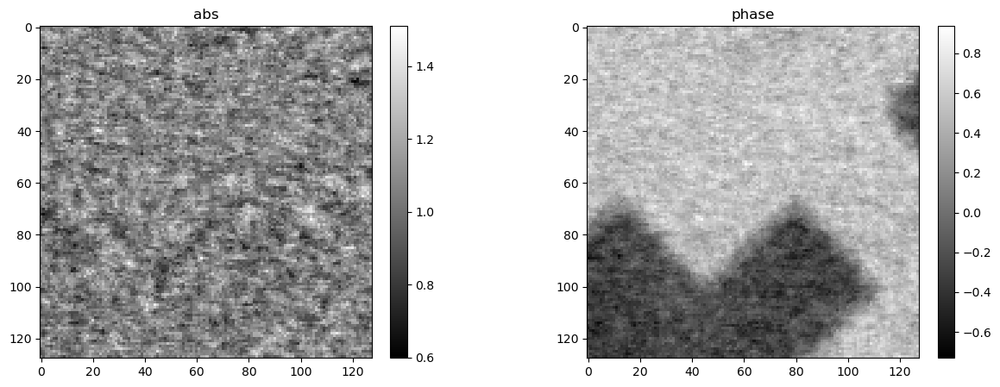

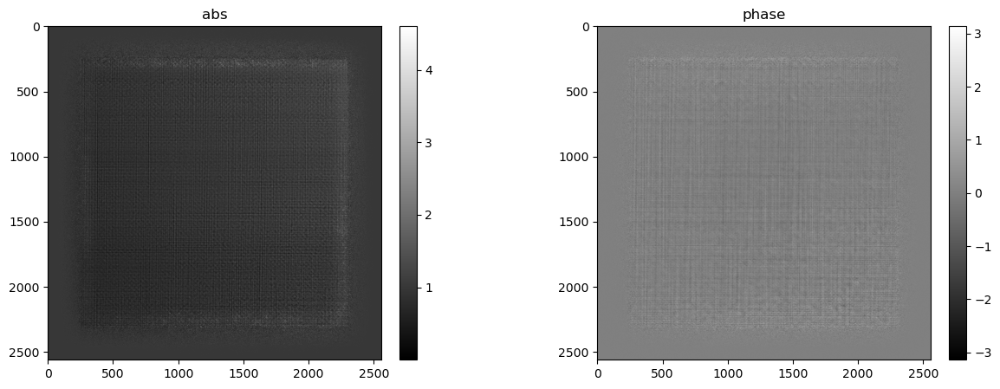

145) alpha=0.10834, err=1.40366e+04
146) alpha=0.10462, err=1.40117e+04
147) alpha=0.10561, err=1.39869e+04
148) alpha=0.10734, err=1.39619e+04
149) alpha=0.10962, err=1.39373e+04
150) alpha=0.11101, err=1.39126e+04
151) alpha=0.11168, err=1.38882e+04
152) alpha=0.11022, err=1.38643e+04
153) alpha=0.10853, err=1.38408e+04
154) alpha=0.10686, err=1.38179e+04
155) alpha=0.10799, err=1.37948e+04
156) alpha=0.11017, err=1.37719e+04
157) alpha=0.11015, err=1.37492e+04
158) alpha=0.10720, err=1.37272e+04
159) alpha=0.10588, err=1.37055e+04
160) alpha=0.10638, err=1.36839e+04


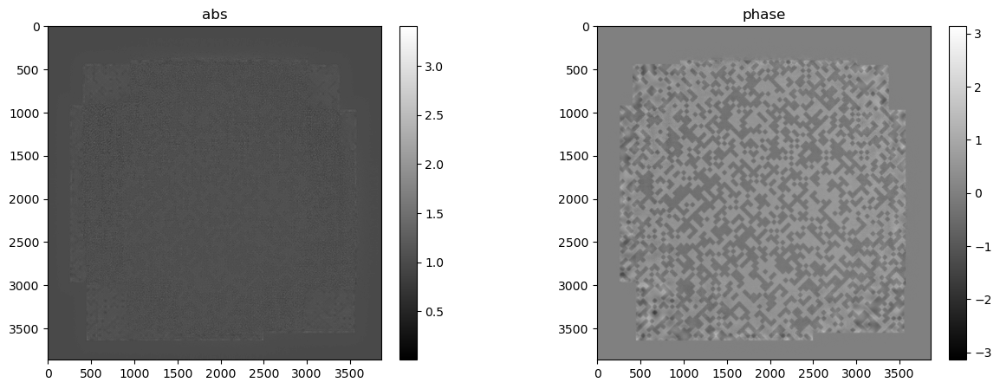

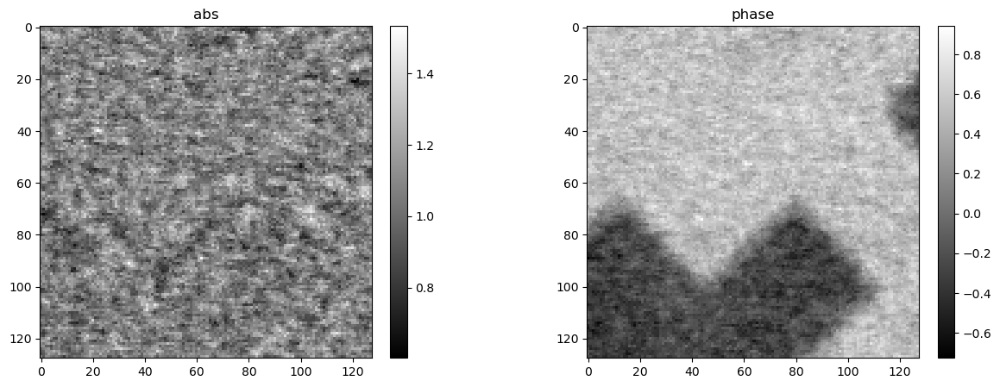

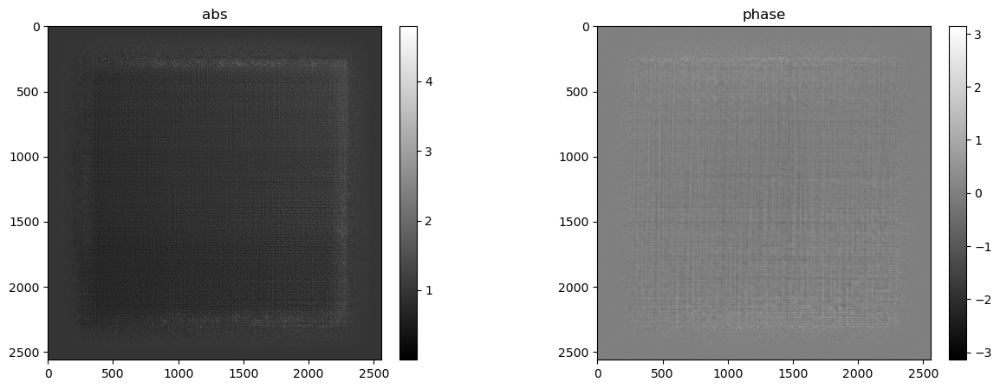

161) alpha=0.10667, err=1.36625e+04
162) alpha=0.10724, err=1.36413e+04
163) alpha=0.10819, err=1.36201e+04
164) alpha=0.11145, err=1.35989e+04
165) alpha=0.10899, err=1.35782e+04
166) alpha=0.10703, err=1.35579e+04
167) alpha=0.10608, err=1.35379e+04
168) alpha=0.10758, err=1.35178e+04
169) alpha=0.10911, err=1.34979e+04
170) alpha=0.10849, err=1.34782e+04
171) alpha=0.10759, err=1.34588e+04
172) alpha=0.10624, err=1.34397e+04
173) alpha=0.10606, err=1.34208e+04
174) alpha=0.10517, err=1.34021e+04
175) alpha=0.10574, err=1.33836e+04
176) alpha=0.10609, err=1.33651e+04


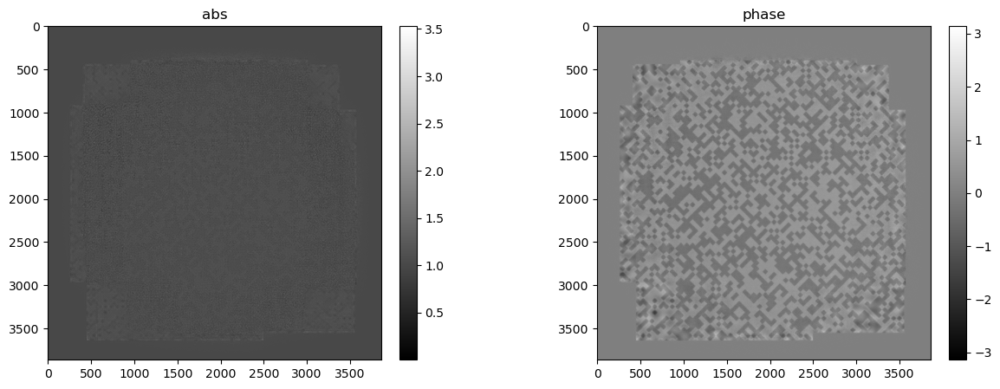

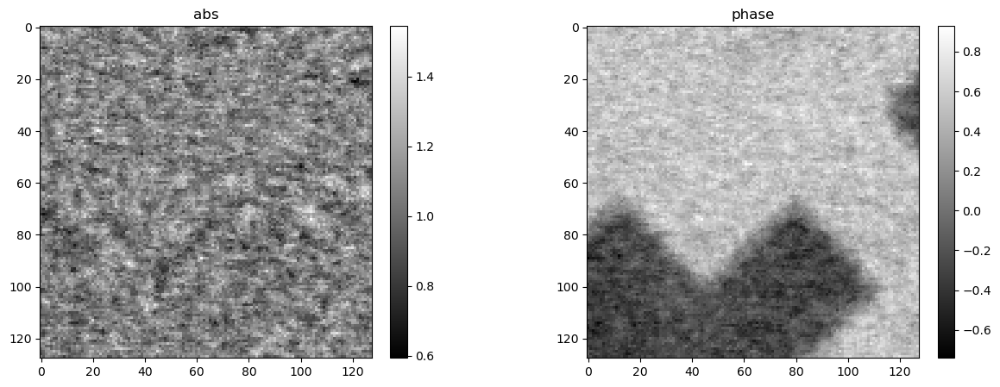

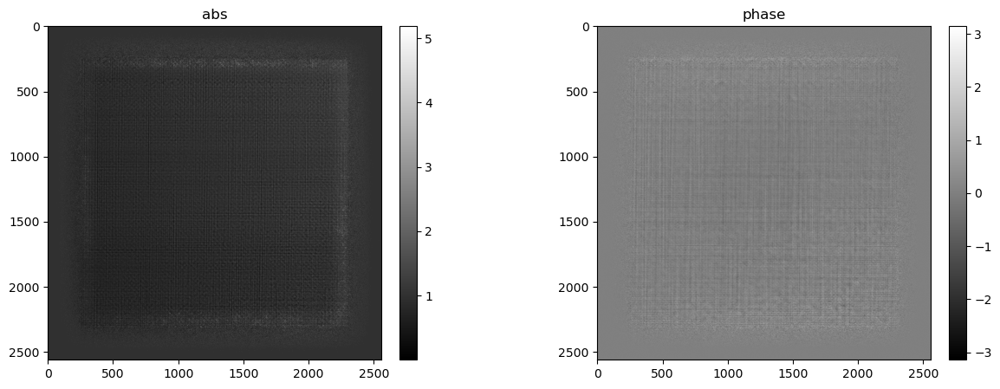

177) alpha=0.10816, err=1.33466e+04
178) alpha=0.10818, err=1.33284e+04
179) alpha=0.10755, err=1.33103e+04
180) alpha=0.10488, err=1.32928e+04
181) alpha=0.10211, err=1.32756e+04
182) alpha=0.09963, err=1.32588e+04
183) alpha=0.09797, err=1.32420e+04
184) alpha=0.10120, err=1.32255e+04
185) alpha=0.10229, err=1.32086e+04
186) alpha=0.10254, err=1.31920e+04
187) alpha=0.10402, err=1.31755e+04
188) alpha=0.10520, err=1.31588e+04
189) alpha=0.10268, err=1.31428e+04
190) alpha=0.10317, err=1.31266e+04
191) alpha=0.10265, err=1.31107e+04
192) alpha=0.10358, err=1.30949e+04


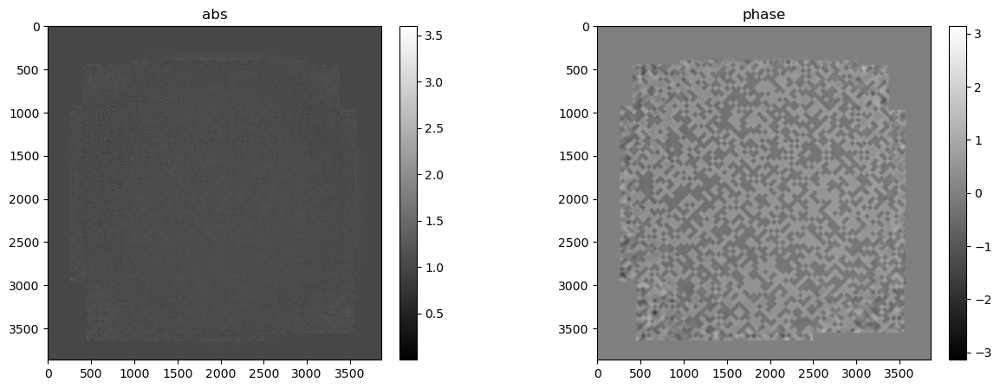

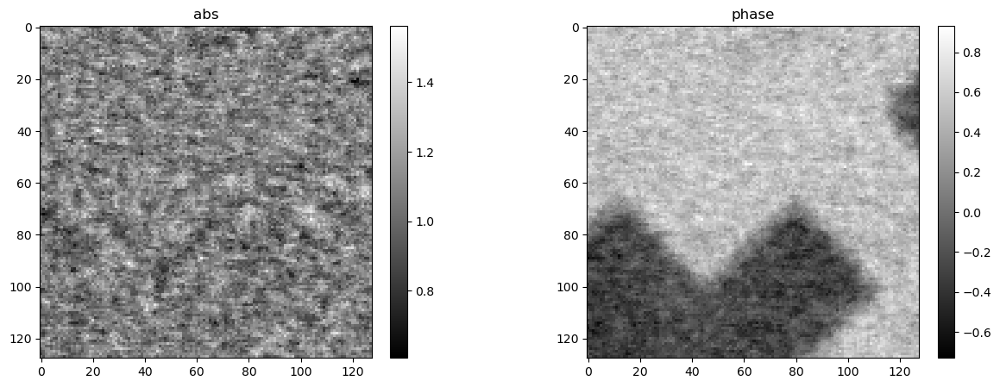

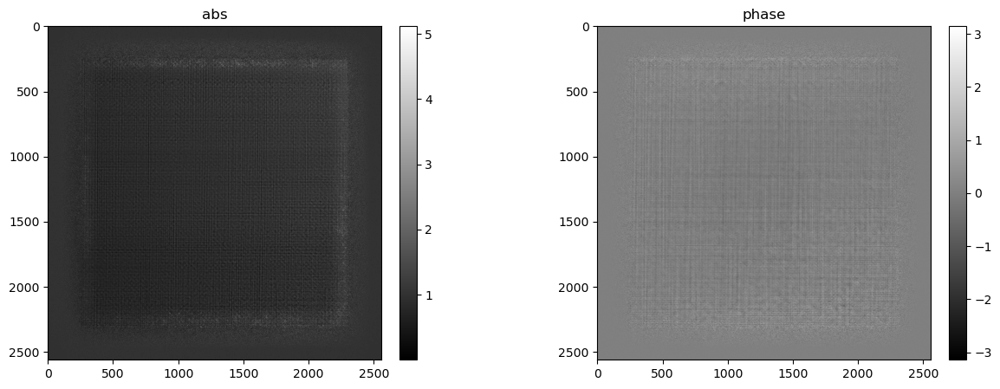

193) alpha=0.10182, err=1.30794e+04
194) alpha=0.09945, err=1.30640e+04
195) alpha=0.10215, err=1.30487e+04
196) alpha=0.10465, err=1.30332e+04
197) alpha=0.10443, err=1.30179e+04
198) alpha=0.10358, err=1.30028e+04
199) alpha=0.10527, err=1.29877e+04
200) alpha=0.10390, err=1.29728e+04
201) alpha=0.10290, err=1.29582e+04
202) alpha=0.10043, err=1.29438e+04
203) alpha=0.10068, err=1.29295e+04
204) alpha=0.09910, err=1.29154e+04
205) alpha=0.09829, err=1.29015e+04
206) alpha=0.09976, err=1.28876e+04
207) alpha=0.10189, err=1.28736e+04
208) alpha=0.10051, err=1.28599e+04


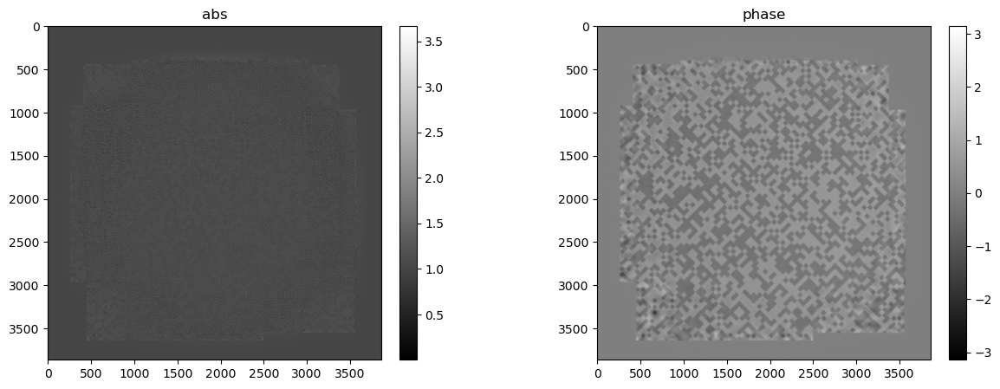

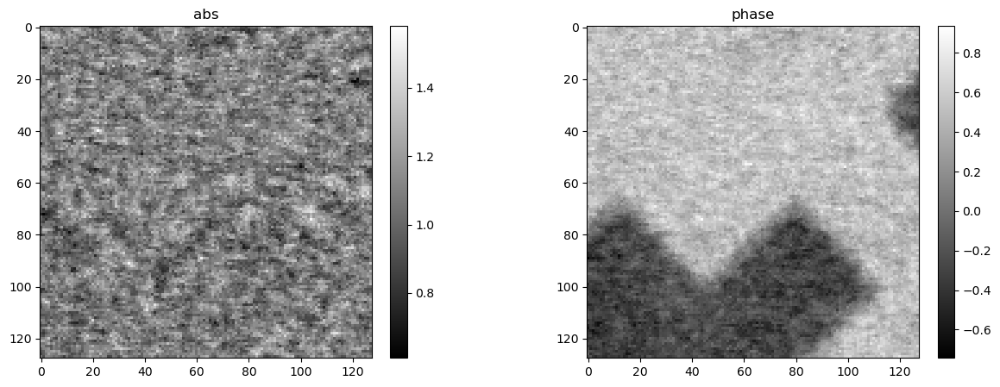

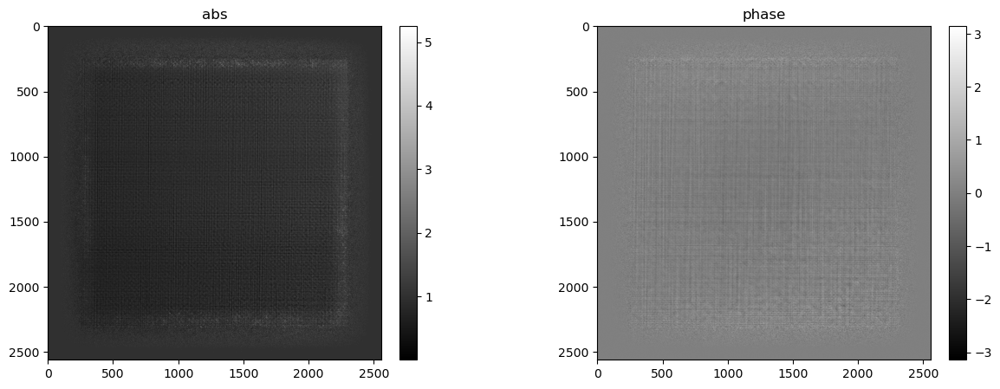

209) alpha=0.09875, err=1.28464e+04
210) alpha=0.09959, err=1.28328e+04
211) alpha=0.10178, err=1.28192e+04
212) alpha=0.10347, err=1.28057e+04
213) alpha=0.10255, err=1.27922e+04
214) alpha=0.10090, err=1.27791e+04
215) alpha=0.09910, err=1.27661e+04
216) alpha=0.09838, err=1.27533e+04
217) alpha=0.09876, err=1.27405e+04
218) alpha=0.09777, err=1.27279e+04
219) alpha=0.09638, err=1.27155e+04
220) alpha=0.09683, err=1.27031e+04
221) alpha=0.09731, err=1.26908e+04
222) alpha=0.09815, err=1.26785e+04
223) alpha=0.09971, err=1.26661e+04
224) alpha=0.10027, err=1.26538e+04


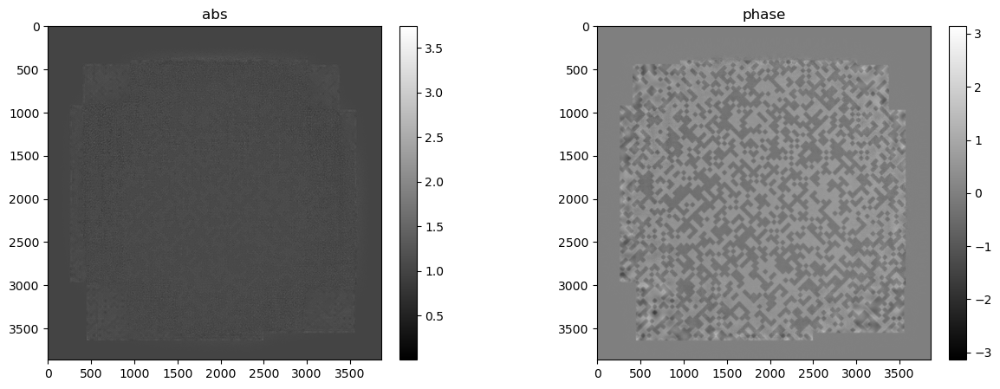

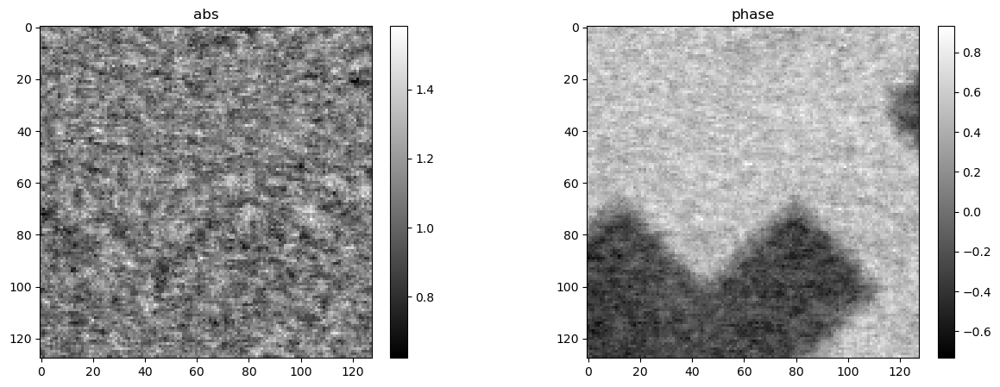

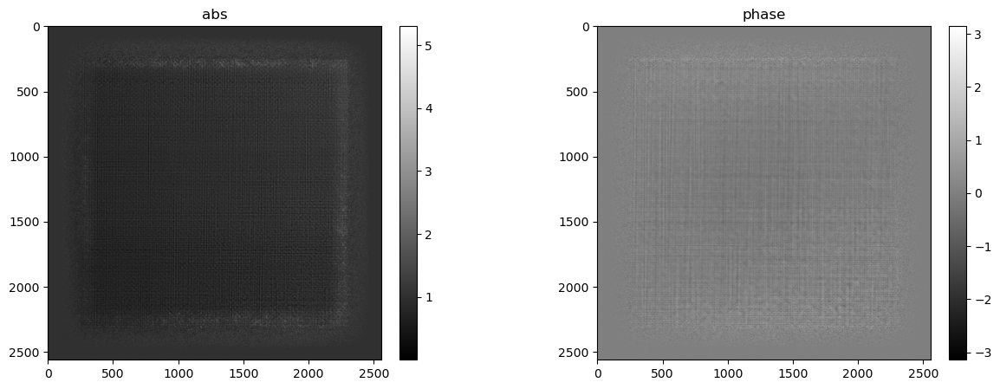

225) alpha=0.10011, err=1.26417e+04
226) alpha=0.09848, err=1.26297e+04
227) alpha=0.09840, err=1.26178e+04
228) alpha=0.09876, err=1.26060e+04
229) alpha=0.09963, err=1.25942e+04
230) alpha=0.10046, err=1.25824e+04
231) alpha=0.09985, err=1.25707e+04
232) alpha=0.09771, err=1.25593e+04
233) alpha=0.09659, err=1.25480e+04
234) alpha=0.09556, err=1.25368e+04
235) alpha=0.09578, err=1.25257e+04
236) alpha=0.09556, err=1.25146e+04
237) alpha=0.09680, err=1.25036e+04
238) alpha=0.09617, err=1.24926e+04
239) alpha=0.09676, err=1.24817e+04
240) alpha=0.09749, err=1.24708e+04


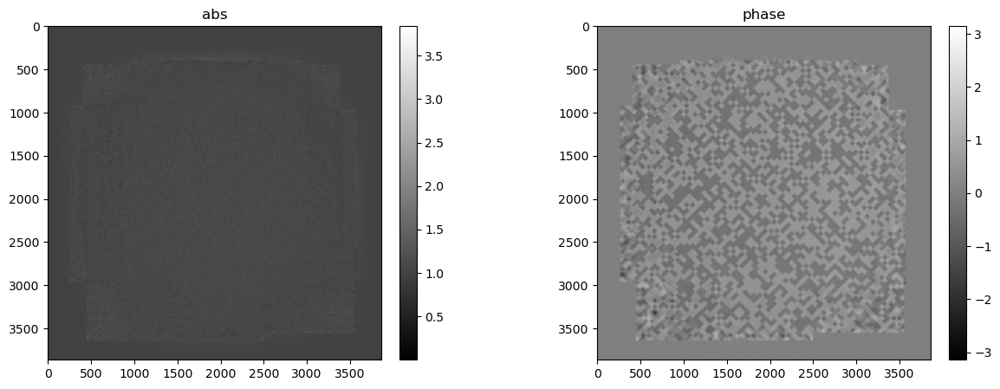

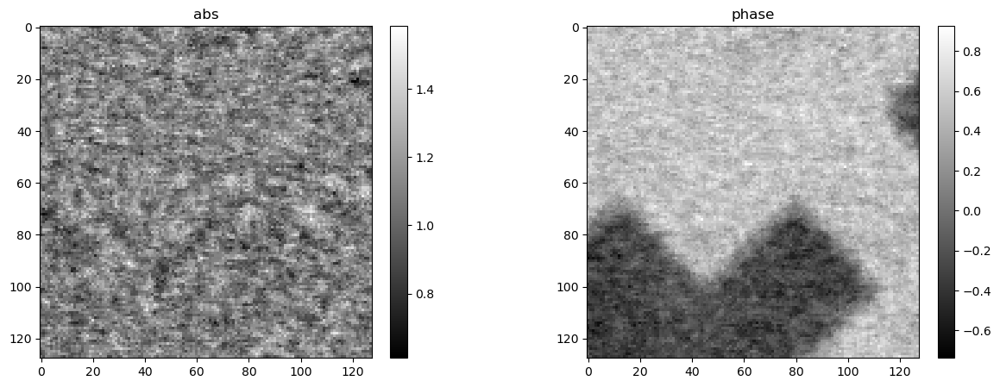

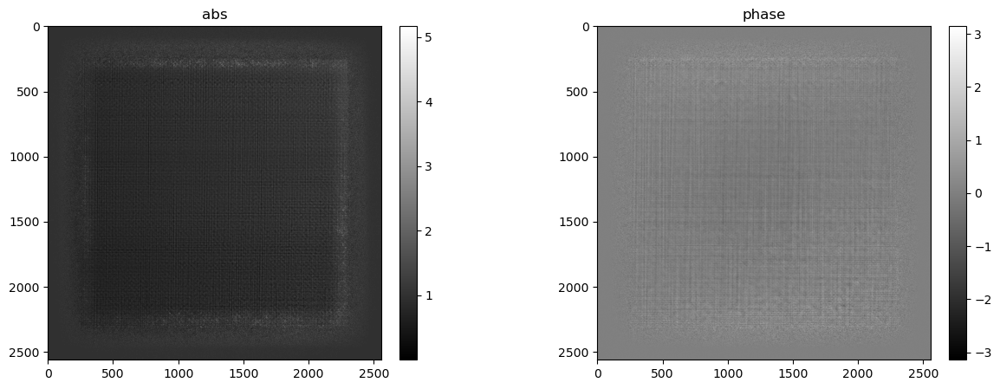

241) alpha=0.09909, err=1.24599e+04
242) alpha=0.09931, err=1.24491e+04
243) alpha=0.09975, err=1.24383e+04
244) alpha=0.09732, err=1.24277e+04
245) alpha=0.09686, err=1.24172e+04
246) alpha=0.09803, err=1.24066e+04
247) alpha=0.09967, err=1.23961e+04
248) alpha=0.09803, err=1.23858e+04
249) alpha=0.09424, err=1.23757e+04
250) alpha=0.09393, err=1.23657e+04
251) alpha=0.09638, err=1.23555e+04
252) alpha=0.09867, err=1.23454e+04
253) alpha=0.09869, err=1.23353e+04
254) alpha=0.09556, err=1.23255e+04
255) alpha=0.09352, err=1.23158e+04
256) alpha=0.09457, err=1.23060e+04


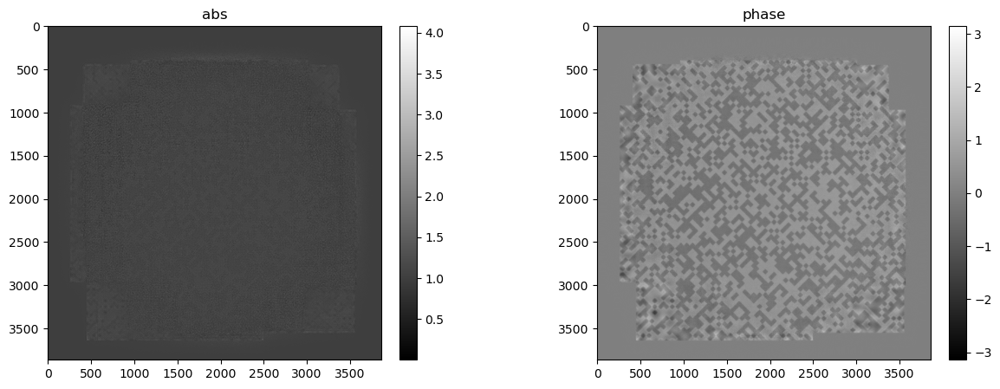

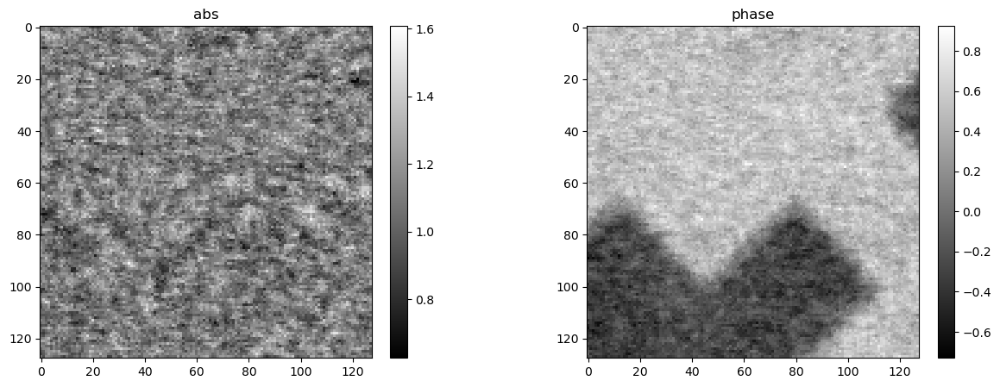

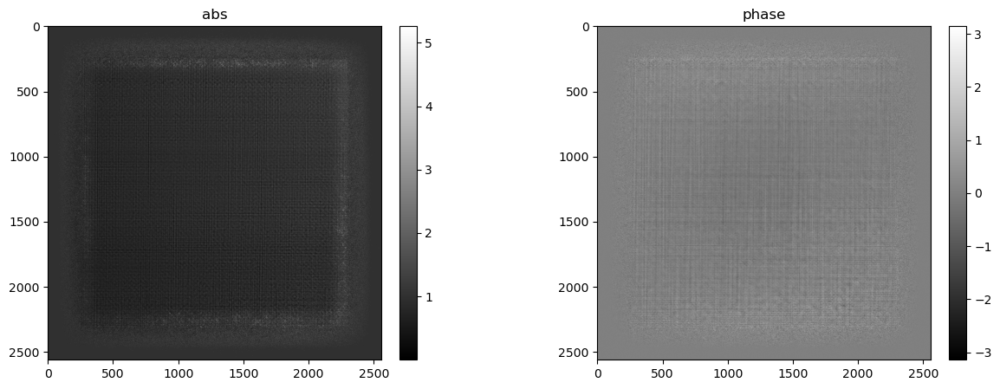

In [8]:
def redot(a,b):
    return cp.sum(a.real*b.real+a.imag*b.imag)

def hessian2(Lpsi,Lpsi1,Lpsi2,data):
    l0 = Lpsi/cp.abs(Lpsi)
    d0 = data/cp.abs(Lpsi)
    v1 = redot(1-d0,cp.real(Lpsi1*cp.conj(Lpsi2)))
    v2 = redot(d0,cp.real(cp.conj(l0)*Lpsi1)*cp.real(cp.conj(l0)*Lpsi2))
    return 2*(v1+v2)

def minf(fpsi,data):
    f = np.linalg.norm(np.abs(fpsi)-data)**2
    return f

def cg_holo(data, init_psi,init_prb,  pars):
    
    data = np.sqrt(data)
    
    psi = init_psi.copy()
    prb = init_prb.copy()

    erra = np.zeros(pars['niter'])
    alphaa = np.zeros(pars['niter'])
    
    for i in range(pars['niter']):                                        
        
        Lpsi = Lop(Sop(psi)*prb)                
        gradx = 2*LTop(Lpsi-data*(Lpsi/cp.abs(Lpsi)))  
        
        gradpsi = STop(gradx*cp.conj(prb))                     
        gradprb = cp.sum(gradx*cp.conj(Sop(psi)),axis=1)
        
        if i==0:
            etapsi = -gradpsi
            etaprb = -gradprb
        else:
            Lpsi = Lop(Sop(psi)*prb)            
            Lksi = Lop(Sop(gradpsi)*prb+Sop(psi)*gradprb)   
            Leta = Lop(Sop(etapsi)*prb+Sop(psi)*etaprb)     
            # top
            top = hessian2(Lpsi,Lksi,Leta,data)
            top += redot(gradx,Sop(gradpsi)*etaprb+Sop(etapsi)*gradprb)
            # bottom
            bottom = hessian2(Lpsi,Leta,Leta,data)
            bottom += 2*redot(gradx,Sop(etapsi)*etaprb)

            beta = top/bottom
            
            etapsi = -gradpsi + beta*etapsi
            etaprb = -gradprb + beta*etaprb

        #top
        top = -redot(gradpsi,etapsi)-redot(gradprb,etaprb)
        # bottom
        Lpsi = Lop(Sop(psi)*prb)
        Leta = Lop(Sop(etapsi)*prb+Sop(psi)*etaprb)
        
        bottom = hessian2(Lpsi,Leta,Leta,data)
        bottom += 2*redot(gradx,Sop(etapsi)*etaprb)
        
        alpha = top/bottom

        psi += alpha*etapsi
        prb += alpha*etaprb

        if i % pars['err_step'] == 0:
            fpsi = Lop(Sop(psi)*prb)
            err = minf(fpsi,data)
            erra[i] = err
            alphaa[i] = alpha
            print(f'{i}) {alpha=:.5f}, {err=:1.5e}')

        if i % pars['vis_step'] == 0 and pars['vis_step']>0 :
            mshow_polar(psi[0],show)
            mshow_polar(psi[0,ne//2-128:ne//2+128,ne//2-128:ne//2+128],show)
            mshow_polar(prb[0],show)
            dxchange.write_tiff(cp.angle(psi[0]).get(),f'{path}/rec_code_angle{flg}/{i:03}',overwrite=True)
            dxchange.write_tiff(cp.angle(prb[0]).get(),f'{path}/rec_prb_angle{flg}/{i:03}',overwrite=True)
            dxchange.write_tiff(cp.abs(psi[0]).get(),f'{path}/rec_code_abs{flg}/{i:03}',overwrite=True)
            dxchange.write_tiff(cp.abs(prb[0]).get(),f'{path}/rec_prb_abs{flg}/{i:03}',overwrite=True)
            
            # np.save(f'{path}/rec_code_{flg}_{i:03}',psi.get())
            # np.save(f'{path}/rec_prb_{flg}_{i:03}',prb.get())

    return psi,prb,erra,alphaa

# fully on gpu
rec_psi = cp.ones([1,ne,ne],dtype='complex64')#
rec_psi = cp.array(recMultiPaganin.copy())
data = cp.array(data.copy())
# mshow(data[0,0],show)
# mshow_polar(rec_psi[0],show)
rec_prb = cp.ones([1,n+2*pad,n+2*pad],dtype='complex64')
print(data.shape,rec_psi.shape,rec_prb.shape)

pars = {'niter':257, 'err_step': 1, 'vis_step': 16}
rec_psi,rec_prb,erra,alphaa = cg_holo(data,rec_psi,rec_prb, pars)

In [9]:
np.save(f'{path}/rec_code_{flg}',rec_psi.get())
np.save(f'{path}/rec_prb_{flg}',rec_prb.get())
np.save(f'{path}/erra_{flg}',erra)
np.save(f'{path}/alphaa_{flg}',alphaa)